In [1]:
import pandas as pd
import numpy as np
import json
import re 
import sys
import itertools
import dotenv
import os

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

from IPython.display import Image

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth
import spotipy.util as util

import matplotlib.pyplot as plt
from skimage import io

import warnings
warnings.filterwarnings("ignore")

dotenv.load_dotenv()

True

In [2]:
# display plots inline, meaning the plots will be shown directly under the code cell that produced them.
%matplotlib inline

In [3]:
#If you're not familiar with this, save it! Makes using jupyter notebook on laptops much easier
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [4]:
#another useful command to make data exploration easier
# NOTE: if you are using a massive dataset, this could slow down your code. 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

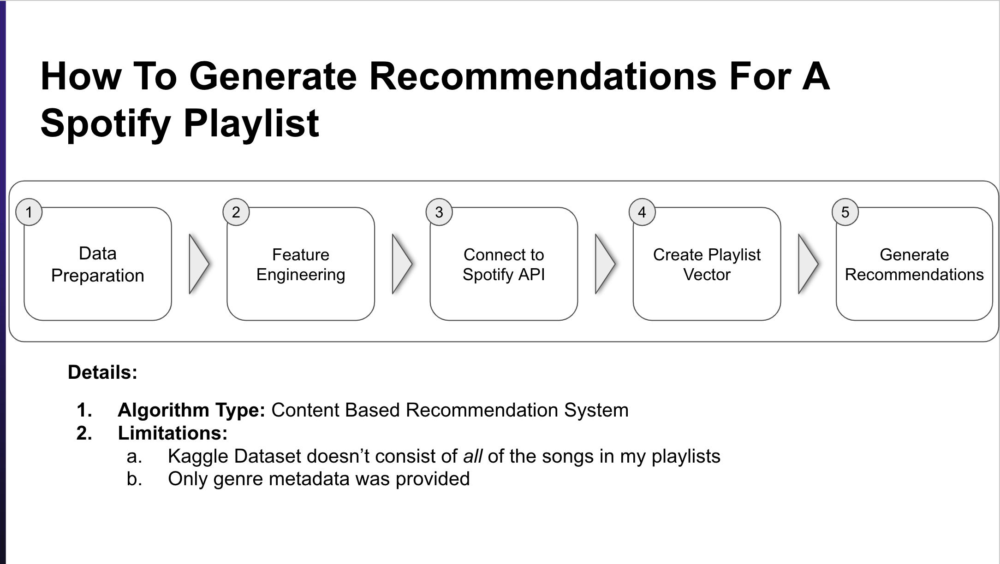

In [5]:
Image("./assets/process.png")

 # 1. Datan valmistelu käyttöä varten

In [6]:
# Meidän täytyy rajoittaa dataa muisti ongelmien välttämiseksi (Otetaan väli jossa on varmasti kappaleita joista haluamme
# luodan vektorin)
spotify_df = pd.read_csv('./recommendations/data/tracks.csv', skiprows=range(1, 50000), nrows=50000)
spotify_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,6PAGJfVrbxdIhIJmbsDLim,Desperados Under the Eaves,44,287733,0,['Warren Zevon'],['3mY9Ii0cL5SQxpOTAm8SHx'],1976,0.337,0.191,5,-16.840,1,0.0330,0.8370,0.084800,0.0587,0.246,144.698,4
1,7uxtHhz6AXBItoCySc3lrE,Two More Bottles Of Wine,44,181733,0,['Delbert McClinton'],['3Ri72CuuQSCLLkDRJgniFU'],1976-01-01,0.641,0.711,9,-9.660,1,0.0473,0.3980,0.000002,0.0853,0.900,140.487,4
2,2XgmRcQs8o709APqLLNUVd,The End Is Not in Sight (The Cowboy Tune) - Re...,44,230867,0,['Amazing Rhythm Aces'],['5wpS6LUdQYMoAreKITVtrH'],1976-04-08,0.696,0.456,4,-15.175,1,0.0295,0.4180,0.000637,0.1200,0.920,130.468,4
3,4CJhWQrtCkppHhOtAZBjik,Hacha Y Machete,44,333480,0,['Héctor Lavoe'],['7opp16lU7VM3l2WBdGMYHP'],1976-01-01,0.581,0.778,10,-8.389,0,0.0475,0.1600,0.000000,0.1760,0.842,104.142,4
4,5sBI6UV3FULOhARmClbJS1,Extra Classic,44,191293,0,['Gregory Isaacs'],['6QHu71f8LLeT8n0GzfbYFc'],1976-01-01,0.804,0.588,9,-11.155,1,0.0370,0.0116,0.001890,0.1470,0.962,133.684,4


## Huomioitavaa

- Tämä data on kappaleiden tasolla
- Numeerisia arvoja joita pystymme käyttämään kappaleiden vertailuun (elävyys, tempo, valenssi jne.). 
- Julkaisupäivämäärästä tulee hyödyllinen. Täytyy one-hot-encoding (OHE) muuttuja julkaisupäivämäärälle viiden vuoden välein. 
- OHE-muuttujia myös suosiolle. Tässäkin viiden vuoden väleinä. 
- Tässä ei ole mitään tietoa kappaleen genrestä, mikä olisi hyödyllistä. Pelkkä tämä data ei auta meitä löytämään asiaankuuluvaa sisältöä, koska tämä on sisältöön perustuva suosittelujärjestelmä. Onneksi on olemassa tiedosto nimeltä artists.csv, josta saadaan kappaleelle genre artistin perusteella.

In [7]:
genre_data = pd.read_csv('./recommendations/data/artists.csv')
genre_data[10000:10005]

,id,followers,genres,name,popularity
10000,3wbftONQjYa0CGlyEwxJUR,36108.0,"['classic schlager', 'discofox', 'schlager', '...",Brunner & Brunner,42
10001,7ynsUZ8GP3m1rFDjvs2svD,16453.0,"['german rock', 'liedermacher', 'ostrock']",Keimzeit,39
10002,1ReCqmDLLcp6Z0bCh2JDCA,7276.0,['albanian pop'],Capital T,40
10003,2MyDQyV0Hui1sTpOQW9jIU,419.0,['kleine hoerspiel'],Markus Topf,39
10004,6IiAqwbN9GAxRHD5JBUcSz,15052.0,"['hoerspiel', 'reading']",Tommy Jaud,55


## Huomioitavaa

- Tämä data on artistin tasolla.
- Genret tulevat olemaan todella hyödyllisiä. Genre-sarake vaikuttaa olevan listamuodossa, mutta se todennäköisesti ei ole. Tutkitaan tätä tarkemmin.

In [8]:
genre_data.dtypes

id             object
followers     float64
genres         object
name           object
popularity      int64
dtype: object

In [9]:
genre_data['genres'].values[0]
genre_data['genres'].values[0][0]


'['

Kuten näemme, se on itse asiassa merkkijono, joka näyttää listalta. Tehdään regex-lause genren poimimiseksi ja syötetään sen listaan.

In [10]:
genre_data['genres_upd'] = genre_data['genres'].apply(lambda x: [re.sub(' ','_',i) for i in re.findall(r"'([^']*)'", x)])

In [11]:
genre_data['genres_upd'].values[10000][0], genre_data['genres_upd'].values[10000][1]

('classic_schlager', 'discofox')

### Nyt meillä on genre-sarake muodossa, jota voimme käyttää.

Tämä data on artistin tasolla ja edellinen datasetti on kappaleen tasolla. Seuraavaksi täytyy:

- Räjäyttää artistit-sarake edellisessä datasetissä niin, että jokaisella kappaleen artistilla (kappaleella voi olla monta artistia) on oma rivinsä.
- Yhdistää genre_data räjäytettyyn datasettiin.

Ensiksi täytyy tehdä kaksi asiaa:

### 1. Samankaltaisesti kuin aiemmin, meidän tarvitsee poimia artistit merkkijonolistasta.

In [12]:
spotify_df['artists_upd_v1'] = spotify_df['artists'].apply(lambda x: re.findall(r"'([^']*)'", x))
spotify_df['artists'].values[0]

"['Warren Zevon']"

In [13]:
spotify_df['artists_upd_v1'].values[0][0]

'Warren Zevon'

Tämä näyttää hyvältä, mutta toimiko tämä jokaiselle artistin merkkijonoformaatille? Tarkistetaan vielä...

In [14]:
spotify_df[spotify_df['artists_upd_v1'].apply(lambda x: not x)].head(5)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1
265,435wiGMomEIavS3j8IG2tZ,Questions,39,239960,0,"[""Manfred Mann's Earth Band""]",['2utNxkLhreF1oIfO8kQT3q'],1976-08-27,0.390,0.277,9,-12.482,1,0.0294,0.738000,0.002840,0.0708,0.204,98.043,4,[]
334,5endSWellqnUqEIO2OOdzj,Cherchez la Femme / Se Si Bon,38,347600,0,"[""Dr. Buzzard's Original Savannah Band""]",['0i64fKwsnTQsPqbov8mZUh'],1976,0.699,0.333,0,-19.342,1,0.0595,0.004010,0.000000,0.0607,0.533,115.147,4,[]
850,0hyZgl8tHThlycPEVwBpax,Baby Love,47,262827,0,"[""Mother's Finest""]",['3csSQdDVhJlP3BUOoZ2N2H'],1977,0.587,0.783,5,-8.608,1,0.0722,0.078400,0.000022,0.7830,0.956,92.059,4,[]
1152,5Or7qYzXrTvGLtGPdSq0zV,Det Bedste Til Mig Og Mine Venner,41,264107,0,"[""Gasolin'""]",['0e7UgnX6ObqqX5EcMeuA0E'],1977-05-01,0.282,0.696,5,-5.081,1,0.0425,0.001320,0.000000,0.6970,0.362,149.560,4,[]
1240,2o1rN5QhKveneGrlBZiMYu,You Make Me Sick,39,129400,0,"[""Satan's Rats""]",['2IJJSEnYTWNaL8Ezk6yzAE'],1977,0.580,0.745,1,-12.324,1,0.0359,0.000065,0.658000,0.0542,0.961,123.498,4,[]


Näyttää siltä, että se ei poiminut kaikkia niistä, ja se johtuu artisteista, joilla on heittomerkki nimessään ja siitä, että he ovat suljettuina täysiin lainausmerkkeihin. Kirjoitetaan toinen regex-lause käsittelemään tämä ja sitten yhdistetään nämä kaksi.

In [15]:
# Regex-lauseke etsii ja palauttaa kaikki tekstit, jotka ovat suljettuina lainausmerkeissä (" "), ja tallentaa ne löydetyt tekstipätkät ryhmään, joka palautetaan.
spotify_df['artists_upd_v2'] = spotify_df['artists'].apply(lambda x: re.findall('\"(.*?)\"',x)) 
spotify_df['artists_upd_v2'].values[164]


[]

In [16]:
# Yhdistetään
spotify_df['artists_upd'] = np.where(spotify_df['artists_upd_v1'].apply(lambda x: not x), spotify_df['artists_upd_v2'], spotify_df['artists_upd_v1'] )

In [17]:
# Luodaan oma kappaleen tunniste, koska samasta kappaleesta on kaksoiskappaleita eri id:llä.
spotify_df['artists_song'] = spotify_df.apply(lambda row: row['artists_upd'][0]+str(row['name']),axis = 1)
# Järjestetään setti
spotify_df.sort_values(['artists_song','release_date'], ascending = False, inplace = True)
spotify_df[spotify_df['name']=='Adore You']

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song
36218,5AnCLGg35ziFOloEnXK4uu,Adore You,71,278747,0,['Miley Cyrus'],['5YGY8feqx7naU7z4HrwZM6'],2013-10-04,0.583,0.655,0,-5.407,1,0.0315,0.1110,0.000004,0.113,0.201,119.759,4,[Miley Cyrus],[],[Miley Cyrus],Miley CyrusAdore You
41885,3jjujdWJ72nww5eGnfs2E7,Adore You,88,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-13,0.676,0.771,8,-3.675,1,0.0483,0.0237,0.000007,0.102,0.569,99.048,4,[Harry Styles],[],[Harry Styles],Harry StylesAdore You
42525,1M4qEo4HE3PRaCOM7EXNJq,Adore You,74,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-06,0.676,0.771,8,-3.675,1,0.0483,0.0237,0.000007,0.102,0.569,99.048,4,[Harry Styles],[],[Harry Styles],Harry StylesAdore You


In [18]:
# Poistetaan duplikaatit
spotify_df.drop_duplicates('artists_song',inplace = True)
spotify_df[spotify_df['name']=='Adore You']

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song
36218,5AnCLGg35ziFOloEnXK4uu,Adore You,71,278747,0,['Miley Cyrus'],['5YGY8feqx7naU7z4HrwZM6'],2013-10-04,0.583,0.655,0,-5.407,1,0.0315,0.1110,0.000004,0.113,0.201,119.759,4,[Miley Cyrus],[],[Miley Cyrus],Miley CyrusAdore You
41885,3jjujdWJ72nww5eGnfs2E7,Adore You,88,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-13,0.676,0.771,8,-3.675,1,0.0483,0.0237,0.000007,0.102,0.569,99.048,4,[Harry Styles],[],[Harry Styles],Harry StylesAdore You


Nyt voidaan räjäyttää setti kuten suunniteltiin...

In [19]:
# Poistetaan genre_data:sta id sarake koska datasetti jo sisältää id:n
upd_genre_data = genre_data.drop(columns="id")

# Räjäytetään 'artists_upd' -sarake 'spotify_df', joka sisältää kappaleiden artistit listoina,
# eli jokainen kappaleen artisti saa oman rivinsä. Tätä varten käytetään 'explode' -toimintoa. 
# Uusi DataFrame sisältää sekä räjäytetyn 'artists_upd' -sarakkeen että 'id' -sarakkeen.
artists_exploded = spotify_df[['artists_upd','id']].explode('artists_upd')

# Yhdistetään datasetti genre datalla vaseemmalla liitoksella ('left join') 'artists_upd' ja 'name' 
# -sarakkeiden välillä. Tämä rikastaa 'artists_exploded' -DataFramea genretiedolla.
artists_exploded_enriched = artists_exploded.merge(upd_genre_data, how = 'left', left_on = 'artists_upd',right_on = 'name')

# Suodatetaan pois ne rivit, joissa 'genres_upd' -sarake on tyhjä (null). 
artists_exploded_enriched_nonnull = artists_exploded_enriched[~artists_exploded_enriched.genres_upd.isnull()]

artists_exploded_enriched_nonnull[artists_exploded_enriched_nonnull['id'] =='6KuQTIu1KoTTkLXKrwlLPV']

,artists_upd,id,followers,genres,name,popularity,genres_upd


Melkein valmista... nyt täytyy enään:

- Ryhmitellä kappaleet id:n perusteella ja käytännössä luoda listoja listoista
- Yhdistää nämä listat ja tulostaa niistä uniikit arvot

In [20]:
# Ryhmitellään DataFrame 'artists_exploded_enriched_nonnull' 'id' -sarakkeen perusteella ja luodaan listoja 'genres_upd' -sarakkeen arvoista
artists_genres_consolidated = artists_exploded_enriched_nonnull.groupby('id')['genres_upd'].apply(list).reset_index()

# Luodaan uusi sarake 'consolidated_genre_lists', joka sisältää uniikit genrelistojen arvot
artists_genres_consolidated['consolidated_genre_lists'] = artists_genres_consolidated['genres_upd'].apply(lambda x: list(set(list(itertools.chain.from_iterable(x)))))

artists_genres_consolidated.head()

,id,genres_upd,consolidated_genre_lists
0,000u1dTg7y1XCDXi80hbBX,"[[dance_pop, europop, new_wave_pop, pop_rock, ...","[europop, scottish_rock, pop_rock, dance_pop, ..."
1,0024tEymsoc9FyKUauQngQ,"[[cyberpunk, new_age, synthesizer]]","[new_age, synthesizer, cyberpunk]"
2,003FTlCpBTM4eSqYSWPv4H,"[[modern_rock, neo_mellow, pop_punk, pop_rock,...","[pop_punk, pop_rock, modern_rock, post-teen_po..."
3,0046quUYhSAFccrKIC3Iht,"[[electro, freestyle, funk, new_jack_swing, qu...","[funk, freestyle, new_jack_swing, urban_contem..."
4,004G9E3EZhxxn5aE9yEQqx,"[[argentine_rock, blues_latinoamericano, latin...","[latin_alternative, rock_nacional, blues_latin..."


In [21]:
# Yhdistetään DataFrame 'spotify_df' 'artists_genres_consolidated' DataFrameen 'id' -sarakkeen avulla vasemmalla liitoksella ('left join')
spotify_df = spotify_df.merge(artists_genres_consolidated[['id','consolidated_genre_lists']], on='id', how='left')

spotify_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidated_genre_lists
0,6p0ecVFjeSu09Ncb1bUEGR,Scattered Days - 2002 Mix Version,1,235093,0,['강수지'],['6yvfQfQ8CS9aXvGlyHEdoi'],2002-03-01,0.669,0.4710,7,-6.515,0,0.0330,0.382,0.000000,0.0963,0.470,67.988,4,[강수지],[],[강수지],강수지Scattered Days - 2002 Mix Version,[classic_korean_pop]
1,1M97kKsHd1mw2rj4WCH2TA,你怎麼捨得我難過,48,293840,0,['黃品源'],['22eZSsFE2fxLnnC9Zga25b'],1990-06-30,0.578,0.3340,9,-11.974,0,0.0267,0.541,0.000006,0.0675,0.243,135.934,4,[黃品源],[],[黃品源],黃品源你怎麼捨得我難過,"[c-pop, classic_mandopop, mandopop]"
2,5cbbtFwm09MwwicU9SDHJA,掌聲響起,44,259387,0,['鳳飛飛'],['13ILSgBPHS5T6YCFw9Pc7R'],1986-09-30,0.358,0.2080,10,-9.524,1,0.0339,0.884,0.000002,0.1500,0.278,131.261,4,[鳳飛飛],[],[鳳飛飛],鳳飛飛掌聲響起,"[c-pop, classic_mandopop, vintage_chinese_pop]"
3,3LoGT3vFIUqpcNmFm4PUn4,そんなヒロシに騙されて,41,187240,0,['高田みづえ'],['2gSv29tig3fcanFgMBqq3J'],1983-08-21,0.615,0.7230,5,-5.553,0,0.0315,0.423,0.000000,0.2850,0.543,139.860,4,[高田みづえ],[],[高田みづえ],高田みづえそんなヒロシに騙されて,[idol_kayo]
4,0aFLzyYOsaP5sf37DcY5fC,要愛就愛,23,173893,0,['霜華雪華'],['1yigjFXO8LMVXPhwqYTPol'],1964-07-15,0.694,0.0914,0,-17.304,0,0.0481,0.845,0.000000,0.1120,0.465,109.759,4,[霜華雪華],[],[霜華雪華],霜華雪華要愛就愛,[vintage_taiwan_pop]


# 2. Ominaisuuksien suunnittelu

- Normalisoidaan liukulukumuuttujat
- One-Hot-Encoding (OHE) vuosi- ja suosiomuuttujat
- Luodaan artistigenreistä TF-IDF ominaisuuksia

In [22]:
spotify_df.tail()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidated_genre_lists
47329,42OhQBFNIbMyxRGxyPOvQA,"Not Tonight (feat. Da Brat, Left Eye, Missy ""M...",55,252520,0,"[""Lil' Kim"", 'Angie Martinez', 'Lisa ""Left Eye...","['5tth2a3v0sWwV1C7bApBdX', '6VJqy1YyzrK4ZhgGs9...",1997-06-30,0.854,0.602,6,-10.162,0,0.3200,0.0689,0.00000,0.292,0.592,99.429,4,"[ Kim"", , , , , , , ]","[Lil' Kim, Left Eye]","[ Kim"", , , , , , , ]","Kim"", Not Tonight (feat. Da Brat, Left Eye, M...",NaN
47330,5jv3QxL0MFswzM1UJ2qQJM,How Many Licks? (feat. Sisqo),55,232800,1,"[""Lil' Kim"", 'Sisqo']","['5tth2a3v0sWwV1C7bApBdX', '6x9QLdzo6eBZxJ1bHs...",2000-06-16,0.777,0.846,10,-3.110,0,0.1940,0.0508,0.00000,0.309,0.646,105.450,4,"[ Kim"", ]",[Lil' Kim],"[ Kim"", ]","Kim"", How Many Licks? (feat. Sisqo)",NaN
47331,2LP2uDQQ7eLMcUVE4aOpAV,Crush on You (feat. Lil' Cease) - Remix,61,275947,0,"[""Lil' Kim"", ""Lil' Cease""]","['5tth2a3v0sWwV1C7bApBdX', '6V4zyNV40Zyu5MGlhD...",1997-06-30,0.748,0.693,11,-7.832,0,0.2780,0.2820,0.00000,0.123,0.768,88.802,4,"[ Kim"", ""Lil]","[Lil' Kim, Lil' Cease]","[ Kim"", ""Lil]","Kim"", ""LilCrush on You (feat. Lil' Cease) - R...",NaN
47332,5cIU5GZBbyMfgfXGcoQVYc,Don't Stop Movin' - Radio Mix,54,215227,0,"[""Livin' Joy"", 'A. Manetta']","['3PUzVXdNnsJGPDTIU7xvqu', '668qGVmYMvOeW6F0XH...",1997-01-01,0.704,0.722,2,-10.815,0,0.0446,0.0287,0.00341,0.297,0.859,129.992,4,"[ Joy"", ]",[Livin' Joy],"[ Joy"", ]","Joy"", Don't Stop Movin' - Radio Mix",NaN
47333,4s0o8TJHfX9LLHa0umnOzT,Sunshine (feat. Lea),64,225173,1,"[""Lil' Flip"", 'Lea']","['4Q5sPmM8j4SpMqL4UA1DtS', '4tAhhPPEWcszcMjhYR...",2004-03-30,0.814,0.387,0,-9.867,1,0.0945,0.0248,0.00000,0.131,0.792,93.961,4,"[ Flip"", ]",[Lil' Flip],"[ Flip"", ]","Flip"", Sunshine (feat. Lea)",NaN


In [23]:
# Lisätään uusi sarake 'year', joka saadaan jakamalla 'release_date' -sarake väliviivojen avulla ja valitsemalla ensimmäinen osa
spotify_df['year'] = spotify_df['release_date'].apply(lambda x: x.split('-')[0])

# Valitaan kaikki float-tyypin muuttujat ja tallennetaan ne muuttujaan 'float_cols'
float_cols = spotify_df.dtypes[spotify_df.dtypes == 'float64'].index.values

# Näytetään 'popularity' -sarakkeen kuvaileva tilastollinen tieto
spotify_df['popularity'].describe()

count    47334.000000
mean        41.678688
std         23.226992
min          0.000000
25%         21.000000
50%         47.000000
75%         59.000000
max        100.000000
Name: popularity, dtype: float64

In [24]:
# Luodaan uusi sarake 'popularity_red', joka lasketaan jakamalla 'popularity' -sarakkeen arvot 5:llä ja muuttamalla ne kokonaisluvuiksi
spotify_df['popularity_red'] = spotify_df['popularity'].apply(lambda x: int(x/5))

# Käytetään lambda-funktiota varmistaaksemme, että 'consolidated_genre_lists' -sarake sisältää listoja, ja jos ei, asetetaan tyhjä lista [] koska tfid
# ei osaa käsitellä null arvoja
spotify_df['consolidated_genre_lists'] = spotify_df['consolidated_genre_lists'].apply(lambda d: d if isinstance(d, list) else [])

# Tulostetaan DataFrame 'spotify_df' ensimmäiset rivit
spotify_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidated_genre_lists,year,popularity_red
0,6p0ecVFjeSu09Ncb1bUEGR,Scattered Days - 2002 Mix Version,1,235093,0,['강수지'],['6yvfQfQ8CS9aXvGlyHEdoi'],2002-03-01,0.669,0.4710,7,-6.515,0,0.0330,0.382,0.000000,0.0963,0.470,67.988,4,[강수지],[],[강수지],강수지Scattered Days - 2002 Mix Version,[classic_korean_pop],2002,0
1,1M97kKsHd1mw2rj4WCH2TA,你怎麼捨得我難過,48,293840,0,['黃品源'],['22eZSsFE2fxLnnC9Zga25b'],1990-06-30,0.578,0.3340,9,-11.974,0,0.0267,0.541,0.000006,0.0675,0.243,135.934,4,[黃品源],[],[黃品源],黃品源你怎麼捨得我難過,"[c-pop, classic_mandopop, mandopop]",1990,9
2,5cbbtFwm09MwwicU9SDHJA,掌聲響起,44,259387,0,['鳳飛飛'],['13ILSgBPHS5T6YCFw9Pc7R'],1986-09-30,0.358,0.2080,10,-9.524,1,0.0339,0.884,0.000002,0.1500,0.278,131.261,4,[鳳飛飛],[],[鳳飛飛],鳳飛飛掌聲響起,"[c-pop, classic_mandopop, vintage_chinese_pop]",1986,8
3,3LoGT3vFIUqpcNmFm4PUn4,そんなヒロシに騙されて,41,187240,0,['高田みづえ'],['2gSv29tig3fcanFgMBqq3J'],1983-08-21,0.615,0.7230,5,-5.553,0,0.0315,0.423,0.000000,0.2850,0.543,139.860,4,[高田みづえ],[],[高田みづえ],高田みづえそんなヒロシに騙されて,[idol_kayo],1983,8
4,0aFLzyYOsaP5sf37DcY5fC,要愛就愛,23,173893,0,['霜華雪華'],['1yigjFXO8LMVXPhwqYTPol'],1964-07-15,0.694,0.0914,0,-17.304,0,0.0481,0.845,0.000000,0.1120,0.465,109.759,4,[霜華雪華],[],[霜華雪華],霜華雪華要愛就愛,[vintage_taiwan_pop],1964,4


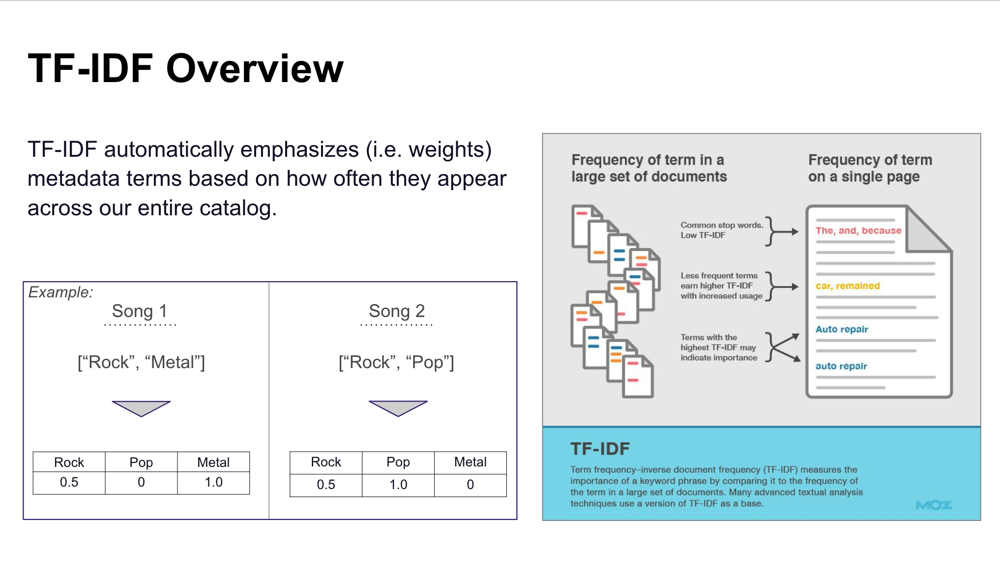

In [25]:
# Function joka luo OHE ominaisuuksia
# Tätä tarvitaan myöhemmin
def ohe_prep(df, column, new_name):
    """ 
    Luo yhden piirteen koodatun sarakkeen tietylle sarakkeelle

    Parametrit: 
        df (pandasin tietokehys): Spotifyn tietokehys
        column (str): Käsiteltävä sarake
        new_name (str): Uusi sarakkeen nimi
        
    Palauttaa: 
        tf_df: Yhden piirteen koodatut ominaisuudet 
    """
    
    # Käytä pandasin get_dummies -toimintoa yhden piirteen koodaamiseen määritettyyn sarakkeeseen
    tf_df = pd.get_dummies(df[column])

    # Hanki vastaluodun tietokehyksen sarakkeiden nimet
    feature_names = tf_df.columns

    # Uudelleennimeä tietokehyksen sarakkeet annetulla uudella nimellä
    tf_df.columns = [new_name + "|" + str(i) for i in feature_names]

    # Nollaa tietokehyksen indeksi
    tf_df.reset_index(drop=True, inplace=True)    
    
    return tf_df

Image('./assets/tfidf.png')

In [26]:
# Function jolla rakennamme koko ominaisuus setin
def create_feature_set(df, float_cols):
    """ 
    Prosessoi Spotifyn tietokehyksen luodaksesi lopullisen ominaisuusjoukon, jota käytetään suositusten luomiseen

    Parametrit: 
        df (pandasin tietokehys): Spotifyn tietokehys
        float_cols (list(str)): Lista liukulukusarakkeista, jotka skaalataan 
        
    Palauttaa: 
        final: lopullinen ominaisuusjoukko 
    """
    
    # Alusta TfidfVectorizer
    tfidf = TfidfVectorizer()

    # Sovita ja muunna genrelistat TF-IDF-matriisiksi
    tfidf_matrix = tfidf.fit_transform(df['consolidated_genre_lists'].apply(lambda x: " ".join(x)))

    # Muunna TF-IDF-matriisi tietokehykseksi
    genre_df = pd.DataFrame(tfidf_matrix.toarray())

    # Uudelleennimeä genre-tietokehyksen sarakkeet
    genre_df.columns = ['genre' + "|" + i for i in tfidf.get_feature_names_out()]

    # Nollaa genre-tietokehyksen indeksi
    genre_df.reset_index(drop=True, inplace=True)

    # Luo yhden piirteen koodattu vuosisarakkeelle ja skaalaa se 0.5: lla
    year_ohe = ohe_prep(df, 'year','year') * 0.5

    # Luo yhden piirteen koodattu suosion_ punainen sarake ja skaalaa se 0.15: llä
    popularity_ohe = ohe_prep(df, 'popularity_red','pop') * 0.15

    # Valitse liukuluvut
    floats = df[float_cols].reset_index(drop=True)

    # Alusta MinMaxScaler
    scaler = MinMaxScaler()

    # Sovita skaalaaja liukulukusarakkeisiin ja muunna ne
    floats_scaled = pd.DataFrame(scaler.fit_transform(floats), columns=floats.columns) * 0.2

    # Yhdistä genre-tietokehys, skaalatut liukulukutietokehykset, yhden piirteen koodattu suosion tietokehys ja yhden piirteen koodattu vuoden tietokehys
    final = pd.concat([genre_df, floats_scaled, popularity_ohe, year_ohe], axis=1)
     
    # Lisää kappaleen tunnussarake
    final['id'] = df['id'].values
    
    return final

In [27]:
complete_feature_set = create_feature_set(spotify_df, float_cols=float_cols)
complete_feature_set.head()

genre|21st_century_classical  genre|432hz  genre|_brasileira  \
0                           0.0          0.0                0.0   
1                           0.0          0.0                0.0   
2                           0.0          0.0                0.0   
3                           0.0          0.0                0.0   
4                           0.0          0.0                0.0   

   genre|_hip_hop  genre|_house  genre|a_cappella  genre|abstract  \
0             0.0           0.0               0.0             0.0   
1             0.0           0.0               0.0             0.0   
2             0.0           0.0               0.0             0.0   
3             0.0           0.0               0.0             0.0   
4             0.0           0.0               0.0             0.0   

   genre|abstract_hip_hop  genre|accordeon  genre|accordion  genre|acid_house  \
0                     0.0              0.0              0.0               0.0   
1                     0.0              0.0              0.0               0.0   
2                     0.0              0.0              0.0               0.0   
3                     0.0              0.0              0.0               0.0   
4                     0.0              0.0              0.0               0.0   

   genre|acid_jazz  genre|acid_rock  genre|acid_techno  genre|acid_trance  \
0              0.0              0.0                0.0                0.0   
1              0.0              0.0                0.0                0.0   
2              0.0              0.0                0.0                0.0   
3              0.0              0.0                0.0                0.0   
4              0.0              0.0                0.0                0.0   

   genre|acousmatic  genre|acoustic  genre|acoustic_blues  \
0               0.0             0.0                   0.0   
1               0.0             0.0                   0.0   
2               0.0             0.0                   0.0   
3               0.0             0.0                   0.0   
4               0.0             0.0                   0.0   

   genre|acoustic_chill  genre|acoustic_guitar_cover  genre|acoustic_pop  \
0                   0.0                          0.0                 0.0   
1                   0.0                          0.0                 0.0   
2                   0.0                          0.0                 0.0   
3                   0.0                          0.0                 0.0   
4                   0.0                          0.0                 0.0   

   genre|acoustic_punk  genre|acoustic_rock  genre|adoracao  genre|adoracion  \
0                  0.0                  0.0             0.0              0.0   
1                  0.0                  0.0             0.0              0.0   
2                  0.0                  0.0             0.0              0.0   
3                  0.0                  0.0             0.0              0.0   
4                  0.0                  0.0             0.0              0.0   

   genre|adult_standards  genre|adventista  genre|afghan_pop  genre|african  \
0                    0.0               0.0               0.0            0.0   
1                    0.0               0.0               0.0            0.0   
2                    0.0               0.0               0.0            0.0   
3                    0.0               0.0               0.0            0.0   
4                    0.0               0.0               0.0            0.0   

   genre|african_gospel  genre|african_percussion  genre|african_reggae  \
0                   0.0                       0.0                   0.0   
1                   0.0                       0.0                   0.0   
2                   0.0                       0.0                   0.0   
3                   0.0                       0.0                   0.0   
4                   0.0                       0.0                   0.0   

   g

# 3. Yhdistetään spotify

In [28]:
#client id ,secret ja redirect uri spotify dashboardilta asetetaan enviroment 
# muuttujiksi bashissa
'''
export SPOTIPY_CLIENT_ID = xxxxx
export SPOTIPY_CLIENT_SECRET = xxxxxx
export SPOTIPY_REDIRECT_URI=http://127.0.0.1:8000/api/spotify/callback/
'''
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth

scope = "user-read-private user-read-email playlist-modify-private playlist-modify-public user-read-currently-playing user-read-playback-position user-read-playback-state playlist-read-private user-read-recently-played user-top-read user-library-read user-modify-playback-state"

SPOTIPY_CLIENT_ID=os.environ.get('SPOTIFY_CLIENT_ID')
SPOTIPY_CLIENT_SECRET=os.environ.get('SPOTIFY_CLIENT_SECRET')

sp = spotipy.Spotify(auth_manager=SpotifyOAuth(scope=scope))

In [29]:
# Haetaan playlistit ja kuvat
id_name = {}
list_photo = {}
for i in sp.current_user_playlists()['items']:
    id_name[i['name']] = i['uri'].split(':')[2]
    list_photo[i['uri'].split(':')[2]] = i['images'][0]['url']

In [30]:
id_name

{'Angst': '5tQAKRgyZPis2WXeMyCpi1',
 'Chill': '12TnrU65MdD0XPBIpZzaPn',
 'This Is Disturbed': '37i9dQZF1DZ06evO2h1EQ0',
 "It's Hits Suomi": '37i9dQZF1DX64Cx4vTeaRB',
 'Relaxing Music': '1r4hnyOWexSvylLokn2hUa',
 'VOLUME SUOMI': '37i9dQZF1DX7Zqfq7rklwe',
 '90s Rock Anthems': '37i9dQZF1DX1rVvRgjX59F',
 'GYM & WORKOUT - ENERGY BOOST - PHONK 2024 - TOP 100': '11qWQdznqIoLPfJMxpNb8q',
 'This Is Mokoma': '37i9dQZF1DZ06evO1AMsvC',
 'Randomshit': '7sfCvm0My2K9s8StSc3Eeb',
 'Your Top Songs 2020': '37i9dQZF1EM13bCjTWM6Ic',
 'Tykätty radiosta': '4ATxFjXhXHwAbKw95x49yY',
 'Mokoma – Ihmissokkelo': '1gGGwULYY0g7PwC1sxxXXj',
 'Tuska 2024': '37i9dQZF1DX3u3fNywFtSp',
 'Heviä treeneihin': '37i9dQZF1DX4hwE1SnAWXj',
 'This Is Stam1na': '37i9dQZF1DZ06evO2lzVeb',
 'This Is Ghost': '37i9dQZF1DZ06evO12mjqo',
 'This Is In This Moment': '37i9dQZF1DZ06evO3OVkju',
 'New Music Friday Suomi': '37i9dQZF1DWXtcXUwhuzFM',
 'Mokoma Radio': '37i9dQZF1E4pY4NmnoyLMt',
 'Jaksaa jaksaa!': '37i9dQZF1DWTXjnGqnDUEs',
 'Beast Mo

In [31]:
def create_necessary_outputs(playlist_name,id_dic, df):
    """ 
    Hakee kappaleita tietyltä soittolistalta.

    Parametrit: 
        playlist_name (str): nimi soittolistalle, jolta haluat hakea Spotify API:n kautta
        id_dic (dic): sanakirja, joka määrittää soittolistan nimen soittolista-id:ksi
        df (pandas dataframe): Spotify-datakehys
        
    Palauttaa: 
        playlist: kaikki soittolistassa olevat kappaleet, JOTKA OVAT SAATAVILLA KAGGLE-DATASETISTA
    """
    
    # Luo soittolista-datakehys
    playlist = pd.DataFrame()
    playlist_name = playlist_name

    # Käy läpi soittolistan kappaleet
    for ix, i in enumerate(sp.playlist(id_dic[playlist_name])['tracks']['items']):
        # Tallenna kappaleen tiedot datakehysään
        playlist.loc[ix, 'artist'] = i['track']['artists'][0]['name']
        playlist.loc[ix, 'name'] = i['track']['name']
        playlist.loc[ix, 'id'] = i['track']['id']
        playlist.loc[ix, 'url'] = i['track']['album']['images'][1]['url']
        playlist.loc[ix, 'date_added'] = i['added_at']

    # Muuta lisäyspäivämäärät aikaleimoiksi
    playlist['date_added'] = pd.to_datetime(playlist['date_added'])  
    
    # Suodata soittolista ja järjestä se lisäyspäivämäärän mukaan laskevasti
    playlist = playlist[playlist['id'].isin(df['id'].values)].sort_values('date_added',ascending = False)
    
    return playlist

In [32]:
playlist_90s = create_necessary_outputs('90s Rock Anthems', id_name,spotify_df)

In [33]:
def visualize_songs(df):
    """ 
    Visualize cover art of the songs in the inputted dataframe

    Parameters: 
        df (pandas dataframe): Playlist Dataframe
    """
    
    temp = df['url'].values
    
    plt.figure(figsize=(15,int(0.625 * len(temp))))

    columns = 5
    
    for i, url in enumerate(temp):
        plt.subplot( int(len(temp) / columns + 1), columns, i + 1)

        image = io.imread(url)
        plt.imshow(image)
        plt.xticks(color = 'w', fontsize = 0.1)
        plt.yticks(color = 'w', fontsize = 0.1)
        plt.xlabel(df['name'].values[i], fontsize = 12)
        plt.tight_layout(h_pad=0.4, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)

    plt.show()

In [34]:
playlist_90s

,artist,name,id,url,date_added
0,The Offspring,The Kids Aren't Alright,4EchqUKQ3qAQuRNKmeIpnf,https://i.scdn.co/image/ab67616d00001e02cbd2ee...,2024-01-18 09:03:43+00:00
49,Live,Lightning Crashes,48iWbsOaBUAGzMdoSmqyg1,https://i.scdn.co/image/ab67616d00001e0223d8d8...,2024-01-18 09:03:43+00:00
51,Pearl Jam,Alive,1L94M3KIu7QluZe63g64rv,https://i.scdn.co/image/ab67616d00001e02d400d2...,2024-01-18 09:03:43+00:00
52,Nine Inch Nails,Closer,5mc6EyF1OIEOhAkD0Gg9Lc,https://i.scdn.co/image/ab67616d00001e024078c2...,2024-01-18 09:03:43+00:00
53,Sublime,What I Got,3B4q6KbHbGV51HO3GznBFF,https://i.scdn.co/image/ab67616d00001e028fc4b0...,2024-01-18 09:03:43+00:00
57,Bush,Machinehead - Remastered,1wrhhPzd2ncJPNgUcGgBGg,https://i.scdn.co/image/ab67616d00001e02158123...,2024-01-18 09:03:43+00:00
58,Guns N' Roses,November Rain,3YRCqOhFifThpSRFJ1VWFM,https://i.scdn.co/image/ab67616d00001e02e44963...,2024-01-18 09:03:43+00:00
60,Nirvana,Heart-Shaped Box,11LmqTE2naFULdEP94AUBa,https://i.scdn.co/image/ab67616d00001e02aca059...,2024-01-18 09:03:43+00:00
62,Lit,My Own Worst Enemy,39sICagGOiysHxoIBRyLLi,https://i.scdn.co/image/ab67616d00001e02c5d01e...,2024-01-18 09:03:43+00:00
64,Everclear,Santa Monica,37EJtTS7jT5WUyXGZzrwnI,https://i.scdn.co/image/ab67616d00001e02ec4d79...,2024-01-18 09:03:43+00:00


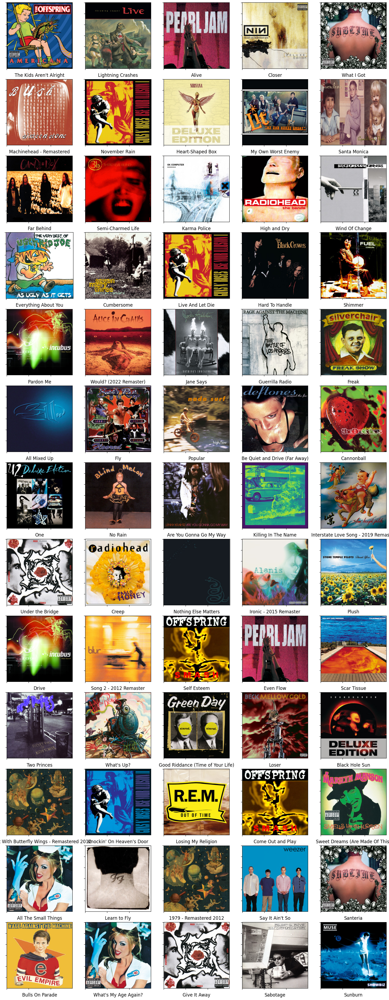

In [35]:
# Visualisoidaan data
visualize_songs(playlist_90s)

# 4. Lasketaan playlististä vektori

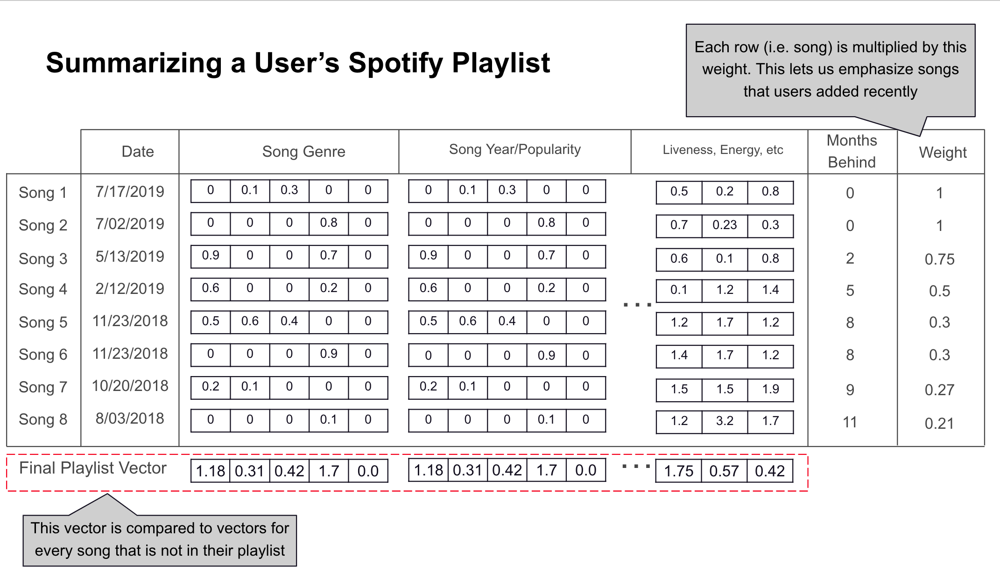

In [36]:
Image('./assets/summarization.png')

In [37]:
def generate_playlist_feature(complete_feature_set, playlist_df, weight_factor):
    """ 
    Tiivistää käyttäjän soittolistan yhdeksi vektoriksi.

    Parametrit: 
        complete_feature_set (pandas dataframe): Datakehys, joka sisältää kaikki Spotify-kappaleiden ominaisuudet
        playlist_df (pandas dataframe): Soittolista-datakehys
        weight_factor (float): Liukuluku, joka edustaa ajankohtaisuuden painotusta. Mitä suurempi painotus, sitä enemmän painotetaan viimeisimpiä kappaleita. Arvon tulisi olla lähellä 1. 
        
    Palauttaa: 
        playlist_feature_set_weighted_final (pandas series): Yksi ominaisuus, joka tiivistää soittolistan
        complete_feature_set_nonplaylist (pandas dataframe): 
    """
    
    # Suodata koko ominaisuusdatakehys vain soittolistalla oleville kappaleille
    complete_feature_set_playlist = complete_feature_set[complete_feature_set['id'].isin(playlist_df['id'].values)]
    complete_feature_set_playlist = complete_feature_set_playlist.merge(playlist_df[['id','date_added']], on='id', how='inner')
    
    # Erota ominaisuusdatakehys soittolistaan ja siihen kuulumattomiin kappaleisiin
    complete_feature_set_nonplaylist = complete_feature_set[~complete_feature_set['id'].isin(playlist_df['id'].values)]
    
    # Järjestä soittolista päivämäärän mukaan laskevasti
    playlist_feature_set = complete_feature_set_playlist.sort_values('date_added', ascending=False)
    
    # Etsi soittolistan viimeisin päivämäärä
    most_recent_date = playlist_feature_set.iloc[0, -1]
    
    # Laske kuukaudet viimeisimmästä päivämäärästä kuhunkin kappaleeseen
    for ix, row in playlist_feature_set.iterrows():
        playlist_feature_set.loc[ix, 'months_from_recent'] = int((most_recent_date.to_pydatetime() - row.iloc[-1].to_pydatetime()).days / 30)
    
    # Laske painot kuhunkin kappaleeseen
    playlist_feature_set['weight'] = playlist_feature_set['months_from_recent'].apply(lambda x: weight_factor ** (-x))
    
    # Kopioi ja päivitä soittolista painotettuna
    playlist_feature_set_weighted = playlist_feature_set.copy()
    playlist_feature_set_weighted.update(playlist_feature_set_weighted.iloc[:, :-4].mul(playlist_feature_set_weighted.weight, 0))
    playlist_feature_set_weighted_final = playlist_feature_set_weighted.iloc[:, :-4]
    
    return playlist_feature_set_weighted_final.sum(axis=0), complete_feature_set_nonplaylist

In [38]:
complete_feature_set_playlist_vector_90s, complete_feature_set_nonplaylist_90s = generate_playlist_feature(complete_feature_set, playlist_90s, 1.09)

# 5. Luodaan ehdotuksia

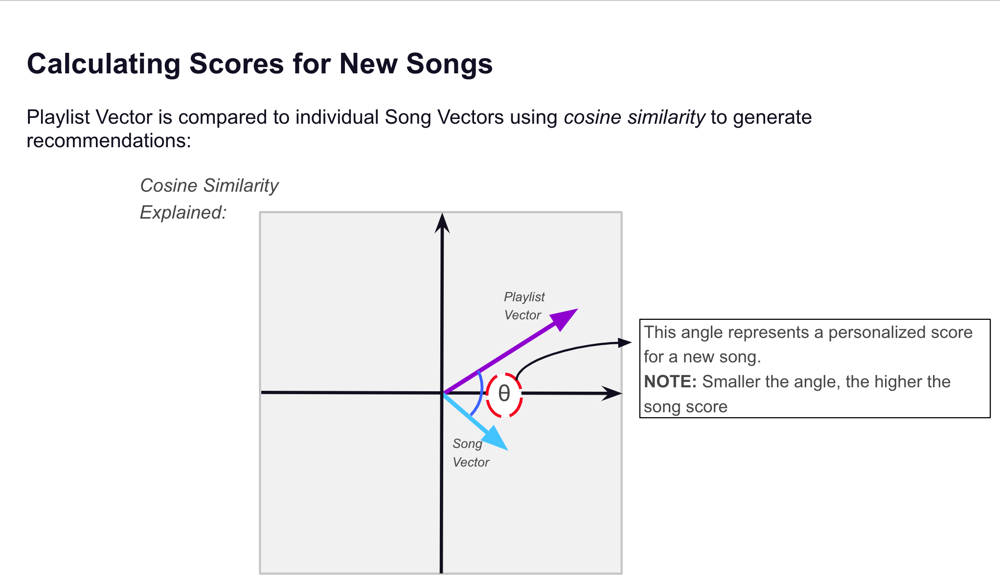

In [39]:
Image('./assets/cosine_sim.png')

In [40]:
def generate_playlist_recos(df, features, nonplaylist_features):
    """ 
    Hakee kappaleita tietyltä soittolistalta.

    Parametrit: 
        df (pandas dataframe): Spotify-datakehys
        features (pandas series): tiivistetty soittolistan ominaisuus
        nonplaylist_features (pandas dataframe): ominaisuusjoukko kappaleille, jotka eivät ole valitussa soittolistassa
        
    Palauttaa: 
        non_playlist_df_top_40: 40 suositusta kappaleesta kyseiselle soittolistalle
    """
    
    # Suodata kappaleet, jotka eivät ole valitussa soittolistassa
    non_playlist_df = df[df['id'].isin(nonplaylist_features['id'].values)]
    
    # Laske kappaleiden samankaltaisuus soittolistan ominaisuuksien kanssa
    non_playlist_df['sim'] = cosine_similarity(nonplaylist_features.drop('id', axis=1).values, features.values.reshape(1, -1))[:,0]
    
    # Valitse parhaat 40 suositusta kappaleet ja hae niille kuvat Spotifyn API:sta
    non_playlist_df_top_40 = non_playlist_df.sort_values('sim', ascending=False).head(40)
    non_playlist_df_top_40['url'] = non_playlist_df_top_40['id'].apply(lambda x: sp.track(x)['album']['images'][1]['url'])
    
    return non_playlist_df_top_40

In [50]:
top40_90s = generate_playlist_recos(spotify_df, complete_feature_set_playlist_vector_90s, complete_feature_set_nonplaylist_90s)

# Poistetaan setistä artists sarake, joka on string -muodossa
top40_90s.drop("artists", axis=1, inplace=True)

# Muutetaan oikea artist datan sarake artists
top40_90s.rename(columns={"artists_upd": "artists"}, inplace=True)

top40_90s

,id,name,popularity,duration_ms,explicit,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists,artists_song,consolidated_genre_lists,year,popularity_red,sim,url
4684,4YFcGTdgmEuw8xTO4XrxbB,Zero - Remastered 2012,64,160173,1,['40Yq4vzPs9VNUrIBG5Jr2i'],1995,0.438,0.728,8,-7.105,1,0.0458,0.000035,0.570000,0.0509,0.7010,128.040,4,[The Smashing Pumpkins],[],[The Smashing Pumpkins],The Smashing PumpkinsZero - Remastered 2012,"[rock, permanent_wave, pop_rock, grunge, alter...",1995,12,0.777050,https://i.scdn.co/image/ab67616d00001e02431ac6...
4692,14qjT3Buddv5GxpVTBw985,Rhinoceros - Remastered 2011,45,390307,0,['40Yq4vzPs9VNUrIBG5Jr2i'],1991-05-28,0.310,0.499,9,-7.992,1,0.0374,0.000389,0.665000,0.2500,0.1970,145.582,4,[The Smashing Pumpkins],[],[The Smashing Pumpkins],The Smashing PumpkinsRhinoceros - Remastered 2011,"[rock, permanent_wave, pop_rock, grunge, alter...",1991,9,0.773042,https://i.scdn.co/image/ab67616d00001e0210930c...
4708,4A0f5CrcOYRVwihIQkcHdP,Bodies - Remastered 2012,48,252200,0,['40Yq4vzPs9VNUrIBG5Jr2i'],1995,0.401,0.918,8,-8.204,0,0.0694,0.000005,0.881000,0.3650,0.3780,108.305,4,[The Smashing Pumpkins],[],[The Smashing Pumpkins],The Smashing PumpkinsBodies - Remastered 2012,"[rock, permanent_wave, pop_rock, grunge, alter...",1995,9,0.768298,https://i.scdn.co/image/ab67616d00001e02431ac6...
4685,7bu0znpSbTks0O6I98ij0W,"Tonight, Tonight - Remastered 2012",70,254627,0,['40Yq4vzPs9VNUrIBG5Jr2i'],1995,0.277,0.670,6,-9.381,1,0.0376,0.000063,0.751000,0.2370,0.2170,148.342,4,[The Smashing Pumpkins],[],[The Smashing Pumpkins],"The Smashing PumpkinsTonight, Tonight - Remast...","[rock, permanent_wave, pop_rock, grunge, alter...",1995,14,0.765681,https://i.scdn.co/image/ab67616d00001e02431ac6...
4700,6912SIXb1G9ql3quOxeCaa,Jellybelly - Remastered 2012,48,181533,0,['40Yq4vzPs9VNUrIBG5Jr2i'],1995,0.209,0.835,1,-8.158,1,0.0569,0.000002,0.873000,0.1910,0.5060,117.003,4,[The Smashing Pumpkins],[],[The Smashing Pumpkins],The Smashing PumpkinsJellybelly - Remastered 2012,"[rock, permanent_wave, pop_rock, grunge, alter...",1995,9,0.764981,https://i.scdn.co/image/ab67616d00001e02431ac6...
4710,6W9nK2wPyJklgDVf0AQcPO,An Ode To No One - Remastered 2012,48,291733,0,['40Yq4vzPs9VNUrIBG5Jr2i'],1995,0.362,0.855,5,-8.806,0,0.0743,0.000143,0.830000,0.1370,0.2150,124.359,4,[The Smashing Pumpkins],[],[The Smashing Pumpkins],The Smashing PumpkinsAn Ode To No One - Remast...,"[rock, permanent_wave, pop_rock, grunge, alter...",1995,9,0.763186,https://i.scdn.co/image/ab67616d00001e02431ac6...
33338,2fhfoZqqTJ8jo4HvWseNfM,I Will Buy You A New Life,58,238133,0,['694QW15WkebjcrWgQHzRYF'],1997-10-07,0.518,0.870,0,-4.933,1,0.0980,0.035100,0.007070,0.2550,0.6610,169.665,4,[Everclear],[],[Everclear],EverclearI Will Buy You A New Life,"[rock, permanent_wave, pop_rock, modern_rock, ...",1997,11,0.762221,https://i.scdn.co/image/ab67616d00001e0265a9e1...
33341,2hx4ptqsE8dboLH3NCLmaN,Father Of Mine,65,231400,0,['694QW15WkebjcrWgQHzRYF'],1997-10-07,0.568,0.940,1,-5.401,1,0.0411,0.000431,0.000050,0.0779,0.7380,97.096,4,[Everclear],[],[Everclear],EverclearFather Of Mine,"[rock, permanent_wave, pop_rock, modern_rock, ...",1997,13,0.761429,https://i.scdn.co/image/ab67616d00001e0265a9e1...
4702,5INe9EN6cNF6axQ4A4BQfy,Here Is No Why - Remastered 2012,50,225120,0,['40Yq4vzPs9VNUrIBG5Jr2i'],1995,0.319,0.654,8,-7.063,1,0.0334,0.000077,0.895000,0.1360,0.6020,79.598,4,[The Smashing Pumpkins],[],[The Smashing Pumpkins],The Smashing PumpkinsHere Is No Why - Remaster...,"[rock, permanent_wave, pop_rock, grunge, alter...",1995,10,0.761296,https://i.scdn.co/image/ab67616d00001e02431ac6...
33343,6BdD561PmmMhpUYI7Qhaut,Everything To Everyone,55,200267,0,['694QW15WkebjcrWgQHzRYF'],1997-10-07,0.646,0.945,0,-5.689,1,0.0473,0.091900,0.000015,0.0599,0.7960,100.027,4,[Everclear],[],[Everclear],EverclearEverything To Everyone,"[rock, permanent_wave, pop_rock, m

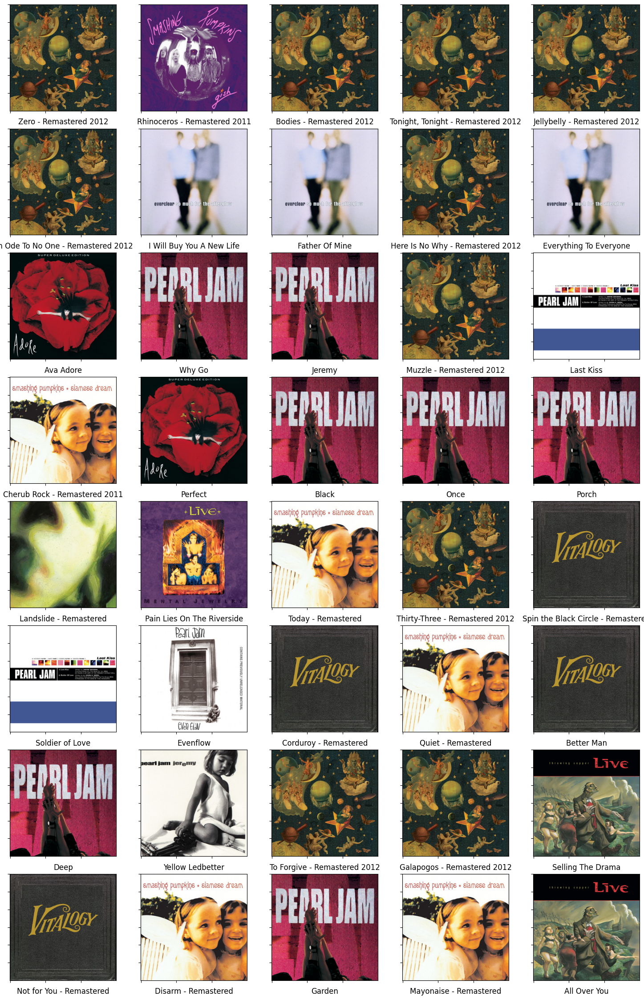

In [42]:
visualize_songs(top40_90s)